## Acquisition d’un signal audio : Quantification, rééchantillonnage et repliement spectral.

#### $\color{red}{\text{Réalisé par : Zahra BENSLIMANE & Tarek BENAISSA }}$


### Préparation :

### **Étude de la quantification**

Soit une quantification uniforme sur N bits de coefficient de pleine échelle A, arrondissant au plus proche quantum.

1- On définit le quantum q comme la distance entre 2 valeurs consécutives de $\Omega$, avec $\Omega$ étant ensemble fini des valeurs autorisées.

$q = 2A/2^N $ , où A = valeur de pleine échelle et N = nombre de bits
                      
2- l’espérance du bruit de quantification et sa densité de probabilité :

Bruit de quantification : $ \epsilon = x_q − x $

Hypothèse: bruit $\epsilon_q$ = processus aléatoire: - centré en 0: $ E(\epsilon_q) = 0$
de loi de probabilité $p_{\epsilon_q} (\epsilon_q)$ uniforme entre -q/2 et q/2


3- Facteur de charge $F = A/\sigma_x$  ---- Indiquer si A est bien choisi?

4- la relation exprimant le RSB de quantification en fonction de N et de F:

$RSB_q = 10 * log(\frac{\sigma_x ^2}{\sigma_q ^2}) =  10 * log(\frac{\sigma_x ^2 * 3 * 2^{2N}}{A^2})$
$      = 20 * log(2) + 10*log(\frac{\sigma_x ^2 * 3}{A^2})$
$      = 6*N - 10 * log(\frac{F^2}{3})$



### **Rééchantillonnage et repliement spectral**

Soit x(t) un signal audio (réel) temps continu de transformée de Fourier X(f), de support
compact [Fmin, Fmax]. Soit xe(t) le signal échantillonné temps continu obtenu à partir de x(t)
avec une fréquence d’échantillonnage Fs

5- Montrer que Fmin = −Fmax.
x(t) est réel

**Symétrie Hermisienne :**


$X(-f) = \Sigma x[n] e^{-j2\pi (-f) nT_e} =  \Sigma x[n] (e^{-j2\pi f nT_e})^* $   avec $x[n] = x[n]^*$

$      =  (\Sigma x[n] e^{-j2\pi f nT_e})^*  = X(f)^*$ 

$|X(-f)| = |X^*(f)|= |X(f)|$

$|X(fmax)| = |X(-fmax)|$

$fmin = -fmax$


6- Quelle est l’expression de la TFSD de xe(t), notée Xe(f) ? Illustrer le résultat à l’aide d’une
figure obtenue en python ou bien tracée à la main


$X_e(f) = TF[x_e(t)] = TF[x(t) Ш_{T_e}(t)] = X(f) * TF[ Ш_{T_e}(t)] = F_e X(f) *  Ш_{F_e}(t) = F_e X(f) * \Sigma_n \delta (f - nFe)$


$X_e(f) =  F_e X(f) *  Ш_{F_e}(n Fe) = F_e X(f) * \Sigma_n \delta (f - nFe)$   -> 

$Xe(f) = Fe* \Sigma_n X(f-nFe)$

périodisation du spectre de x(t) avec un Facteur Fe toutes les Fe 

#### Etude de la quantification :

La fonction de quantification quantif vous est donnée. Elle réalise une quantification uni- forme d’un signal x sur N bits pour une pleine échelle A. Les réponses reposeront sur des mesures expérimentales, réalisées à partir du fichier son donné. Elles seront comparées aux va- leurs théoriques attendues.

In [69]:
from quantif import quantif 
import wave
from scipy.io import wavfile as wav
from IPython.display import Audio

import matplotlib.pyplot as plt
import numpy as np
import math
import os


##### Question 1 :
Charger le signal audio x depuis le fichier sine440.wav : la fonction wav.read(‘myfile’) de python importe les signaux ‘wav’ codés au format ‘PCM’ compris entre −2N−1 et +2N−1 − 1, N étant le nombre de bits sur lequel sont codés les fichiers .wav, égal à 16. Pour être converti en ‘float’ entre −1 et +1, les signaux importés doivent donc être divisés par 2N−1.


In [70]:
samplerate, x = wav.read("sounds/sine440.wav", 'r');
display(Audio("sounds/sine440.wav"),samplerate)
print("Fe = " ,samplerate, "Hz" )
print("x = ",x)
x_n =  x /(2**15)  # Normalisation du signal audio en divisant par 2^(16-1)
print("x_n = ",x_n)

44100

Fe =  44100 Hz
x =  [ 2226  2225  3321 ... -2225 -1116     0]
x_n =  [ 0.06793213  0.06790161  0.10134888 ... -0.06790161 -0.03405762
  0.        ]


#####  Question 2 : 
Pour N = 4 et A = 1, tracer le signal quantifié et le bruit de quantification

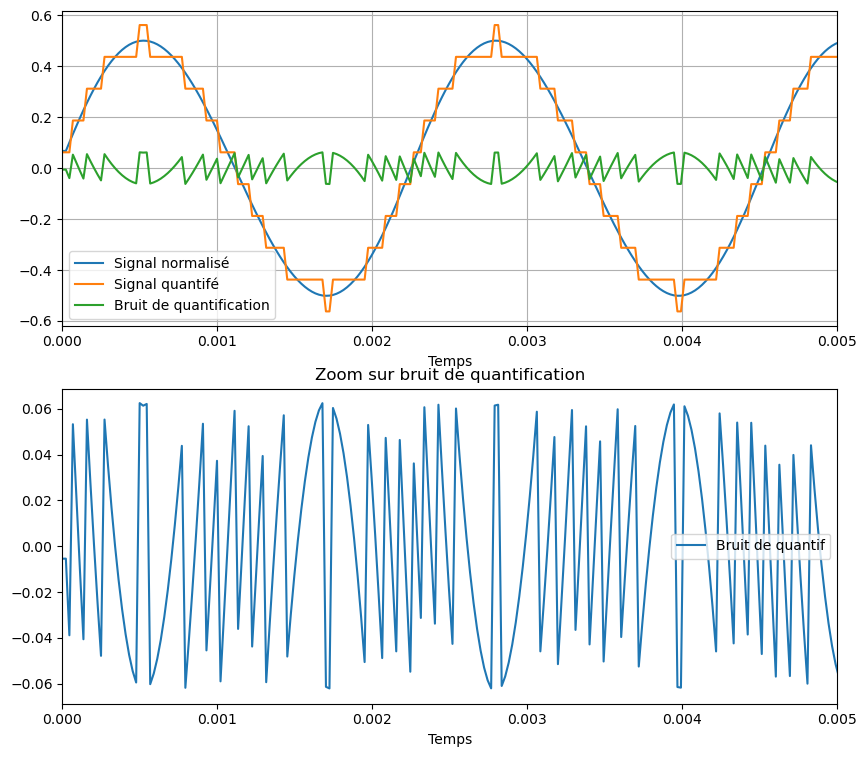

In [71]:
N = 4 # nombre de bit utilisé pour la quantification
A = 1 # valeur de pleine échelle

Y, q,Q = quantif(x_n,A,N)  # Quantification du signal normalisé pour avoir un signal discret en temps
# et en amplitude

## vecteur temps
t = (1/samplerate)*np.arange(len(x)) # génération du vecteur correspondant aux instant d'échantillonnage
bq = Y - x_n # calcul du bruit de quantification

# tracé du signal audio original, du signal quantifié et du bruit de quantification
plt.figure(figsize=(10,9))
plt.subplot(2,1,1)
plt.plot(t,x_n, label = "Signal normalisé")
plt.plot(t,Y, label  =  "Signal quantifé")
plt.plot(t, bq, label = "Bruit de quantification")
plt.xlabel("Temps")
plt.legend()
plt.grid()
plt.xlim((0,0.005))

# Zoom sur le bruit de quantif
plt.subplot(2,1,2)
plt.plot(t, bq, label = "Bruit de quantif")
plt.xlim((0,0.005))
plt.title("Zoom sur bruit de quantification")
plt.xlabel("Temps")
plt.legend()

##### Remarque : 

- On remarque bien que le bruit de quantification est centré en zéro donc l'hypothèse donné dans la partie théorique du TP est vraie.

- Le signal qunatifié est proche du signal réel avec des erreurs de quantification du au quantom, qui est assez grand vu que le nombre de bit utilisé est petit , le choix de A est bon, car le signal normalisé a une amplitude = 1, donc le signal quantifié va couvrir l'ensemble des valeurs du signal.

#### Question 3 :  
Etudier les propriétés statistiques du bruit de quantification (moyenne, variance, etc.) et
caractériser sa densité de probabilité en affichant par exemple l’histogramme de ses valeurs
à l’aide de la commande plt.hist. Comparer les résultats obtenus aux hypothèses posées
en cours.

moy =  2.763190237032313e-05
var =  0.0015618846949353332


Text(0.5, 1.0, 'histogramme bruit de quantification')

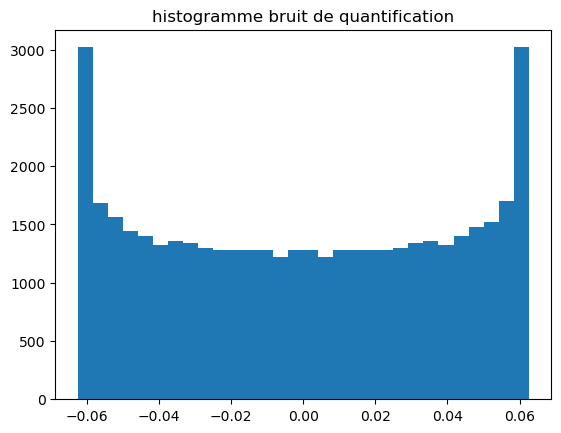

In [72]:
moy = np.mean(bq)   # Moyenne du bruit de quantif
std = np.std(bq)    # l'écart type du bruit de quantif 
var = np.var(bq)    # La variance du bruit de quantif 

print("moy = ", moy)
print("var = ", var)

# Afiichage de l'histogramme
plt.hist(bq, bins = 30)
plt.title("histogramme bruit de quantification")

#### Remarque : 
- La distribution du bruit de quantification ressemble à une loi uniforme,comme indiquée dans la partie théorique. Mais celle ci présente des pics dans les deux extrimités de l'histogramme.
- Les deux pics qui apparessent autour de -0.06 et 0.06 sont dus à la forme de notre signal (sinusoidale pur)
- Lors de l'évolution du signal sinusoidal entre ses deux extrémitées, le signal a une grande partie qui ressemble à une fonction affine pour laquelle les amplitudes sont entre -0.05 et 0.05. Pour cette partie, les erreures de quantifications sont uniformément distribuées, raison pour laquelle l'histogramme est plus au mois plat.
- Cependant, aux extrimités, le signale change de forme et de sens avec des variations faible en amplitude et comme nous avons un quantum assez grand, la majorités des valeurs du signal quantifié sur cette partie prennent la valeur de pleine échelle (+A/-A) et la valeur précedente.
- Si on considère un bruit blanc, nous aurions un histogramme bien uniforme.


#### Question 4 :
Calculer le RSB de quantification pour différentes valeurs du nombre de bits N, 
tracer le RSB de quantification obtenu en fonction de N. Comparer à la courbe théorique.

C:\Users\zahra\AppData\Local\Temp\ipykernel_17016\4177303449.py:18: RuntimeWarning: divide by zero encountered in double_scalars
  RSB_qAF.append(10*math.log10(std_Xn**2 / std_prat**2))


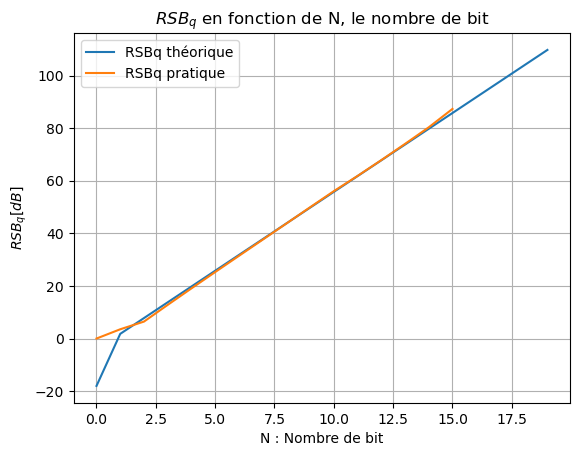

In [73]:
N_tab = np.arange(20) 
# Variance du signal normalisé 
std_Xn = np.std(x_n)  
RSB_q = []
RSB_qAF = []
for N in N_tab:
    # Quantification du signal normalisé
    Y, q,Q = quantif(x_n,A,N)
    # Calcul du RSBq avec la formule théorique 
    RSB_q.append(6*N - 10*np.log10(F**2/3))
    # Calcul du bruit de quantification
    bq = Y - x_n
    # Calcul du Facteur de charge
    F = A/ std_Xn
    # L'écart type du bruit de quantification
    std_prat = np.std(bq) 
    # Calcul du RSBq pratique 
    RSB_qAF.append(10*math.log10(std_Xn**2 / std_prat**2))

# tracer le RSB de quantification obtenu en fonction de N
fig = plt.figure()
plt.plot(N_tab, RSB_q,label = "RSBq théorique")
plt.plot(N_tab, RSB_qAF,label = "RSBq pratique")
plt.title("$RSB_q$ en fonction de N, le nombre de bit")
plt.xlabel("N : Nombre de bit")
plt.ylabel("$RSB_q[dB]$")
plt.legend()
plt.grid()


- La courbe du rapport signal sur bruit pratique est supperposé sur la courbe théorique, l'hypothèse et l'approximation de calcul  prise dans la partie théorique n'a pas grandement affecté le RSBq.

#### Question 5:
Pour N = 8 et pour différentes valeurs de A bien choisies, tracer le signal quantifié et le comparer à x.

Text(0.5, 0, 'Temps(s)')

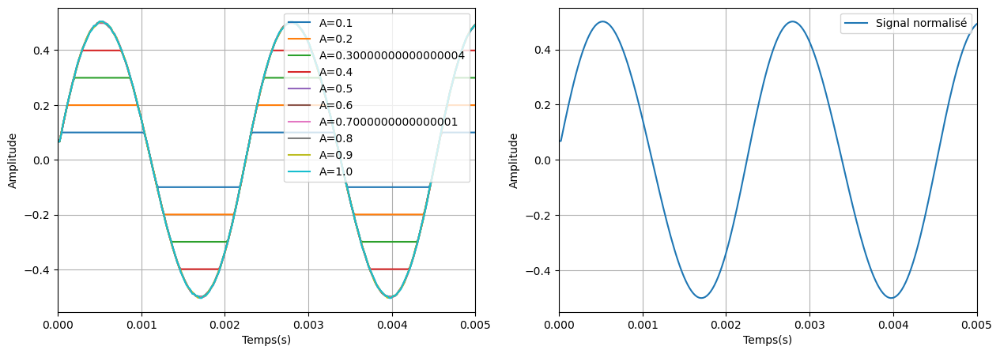

In [74]:
N = 8 # nombre de bit utilisé pour la quantification
A_tab = np.arange(start=0.1,stop=1.1,step=0.1)

t = (1/samplerate)*np.arange(len(x))

fig = plt.figure(figsize = (15,5))
plt.subplot(1,2,1)
plt.ylabel("Amplitude")
plt.xlabel("Temps(s)")
plt.xlim([0,0.005])
plt.grid()

for A in A_tab:
    Y, q,Q = quantif(x_n,A,N) 
    plt.plot(t, Y, label="A="+str(A))
    plt.legend()
    
plt.subplot(1,2,2)
plt.plot(t,x_n, label = "Signal normalisé") 
plt.legend()
plt.grid()
plt.xlim([0,0.005])
plt.ylabel("Amplitude")
plt.xlabel("Temps(s)")


#### Remarque : 
- En reduisant la valeur de pleine échelle, le signal quantifié est écrété à +/-A, ce que conduit à une plus grande perte d'information.
- Le quantifieur optimal est celui qui minimise la distorsion.

#### Question 6 (a) : 
Fixer N = 8. Faire varier A sur un intervalle judicieusement choisi, et pour chaque
valeur, calculer le RSB de quantification et le facteur de charge F. Tracer le RSB de
quantification obtenu en fonction de A, puis en fonction du facteur de charge en dB :
10 log(F
2
).

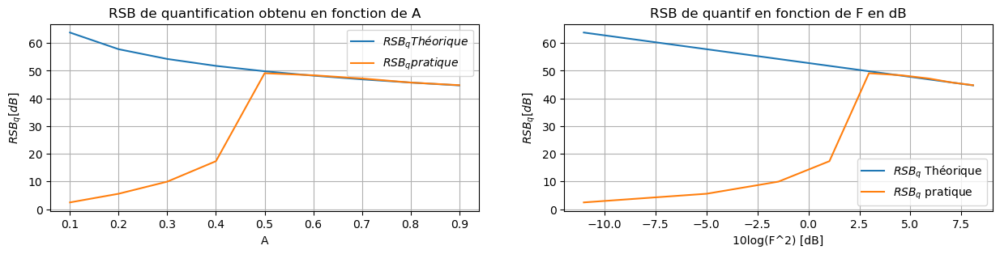

In [75]:
N = 8
A_tab = np.arange(0.1,1,0.1)
std_Xn = np.std(x_n)  # écart type du signal normalisé

RSB_qAF = []  #stockage du RSBq théorique
RSB_qAF_prat = []  # stockage du RSBq pratique
tab_F = []  # stockage du facteur de charge en dB

for A in A_tab:
    # Quantification
    Y, q,Q = quantif(x_n,A,N)
    # Calcul du facteur de charge
    F = A/ std_Xn;
    # Facteur de charge en dB
    tab_F.append(10*math.log10(F**2))
    RSB_qAF.append(6*N - 10*np.log10(F**2/3))
    # Bruit de quantif
    bq = Y - x_n
    # L'écart type du bruit de quantification
    std_prat = np.std(bq)
    # Calcul du RSBq pratique
    RSB_qAF_prat.append(10*math.log10(std_Xn**2 / std_prat**2))

# tracer le RSB de quantification obtenu en fonction de N
fig = plt.figure(figsize = (15,3))
plt.subplot(1,2,1)
plt.plot(A_tab,RSB_qAF, label = "$RSB_q Théorique$" )
plt.plot(A_tab,RSB_qAF_prat, label = "$RSB_q pratique$") 
plt.title("RSB de quantification obtenu en fonction de A")
plt.xlabel("A")
plt.ylabel("$RSB_q[dB]$")
plt.legend()
plt.grid()

plt.subplot(1,2,2)
plt.plot(tab_F,RSB_qAF, label = "$RSB_q$ Théorique")
plt.plot(tab_F,RSB_qAF_prat, label = "$RSB_q$ pratique") 
plt.title("RSB de quantif en fonction de F en dB")
plt.xlabel("10log(F^2) [dB]")
plt.ylabel("$RSB_q[dB]$")
plt.legend()
plt.grid()

#### Pour des valeurs de A tres grandes !!

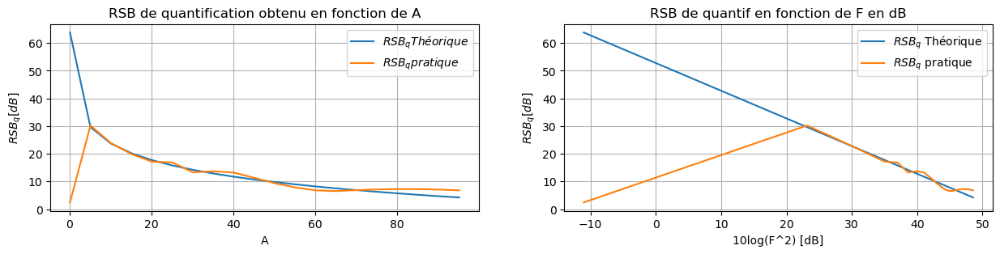

In [76]:
N = 8
A_tab = np.arange(0.1,100,5)
std_Xn = np.std(x_n)  # écart type du signal normalisé

RSB_qAF = []  #stockage du RSBq théorique
RSB_qAF_prat = []  # stockage du RSBq pratique
tab_F = []  # stockage du facteur de charge en dB

for A in A_tab:
    # Quantification
    Y, q,Q = quantif(x_n,A,N)
    # Calcul du facteur de charge
    F = A/ std_Xn;
    # Facteur de charge en dB
    tab_F.append(10*math.log10(F**2))
    RSB_qAF.append(6*N - 10*np.log10(F**2/3))
    # Bruit de quantif
    bq = Y - x_n
    # L'écart type du bruit de quantification
    std_prat = np.std(bq)
    # Calcul du RSBq pratique
    RSB_qAF_prat.append(10*math.log10(std_Xn**2 / std_prat**2))

# tracer le RSB de quantification obtenu en fonction de N
fig = plt.figure(figsize = (15,3))
plt.subplot(1,2,1)
plt.plot(A_tab,RSB_qAF, label = "$RSB_q Théorique$" )
plt.plot(A_tab,RSB_qAF_prat, label = "$RSB_q pratique$") 
plt.title("RSB de quantification obtenu en fonction de A")
plt.xlabel("A")
plt.ylabel("$RSB_q[dB]$")
plt.legend()
plt.grid()

plt.subplot(1,2,2)
plt.plot(tab_F,RSB_qAF, label = "$RSB_q$ Théorique")
plt.plot(tab_F,RSB_qAF_prat, label = "$RSB_q$ pratique") 
plt.title("RSB de quantif en fonction de F en dB")
plt.xlabel("10log(F^2) [dB]")
plt.ylabel("$RSB_q[dB]$")
plt.legend()
plt.grid()

**Remarque:** 
- Pour des valeurs de A plus petites que l'amplitude du signal(ici normalisé), le bruit de quantification d'autant plus grand que A est petit, ce qui conduit à un mauvais rapport signal sur bruit.
- A partir de A = 0.5, le RSB pratique est supperposé au RSB thorique.
- Si A est trés grand(~1000), le signal quantifié devient limité entre -0.5 et 0.5, donc la plage entre 0.5 et A, ne sera pas utilisée et donc provoque des erreurs dqui apparaissent sous forme d'ondulations sur le RSBq.

#### Question 6 ( b) 
Modifier le nombre de bits N et tracer pour chaque valeur le RSB de quantification en 
fonction de 10log(F2). Interpréter les courbes obtenues et les comparer à celles données en cours.

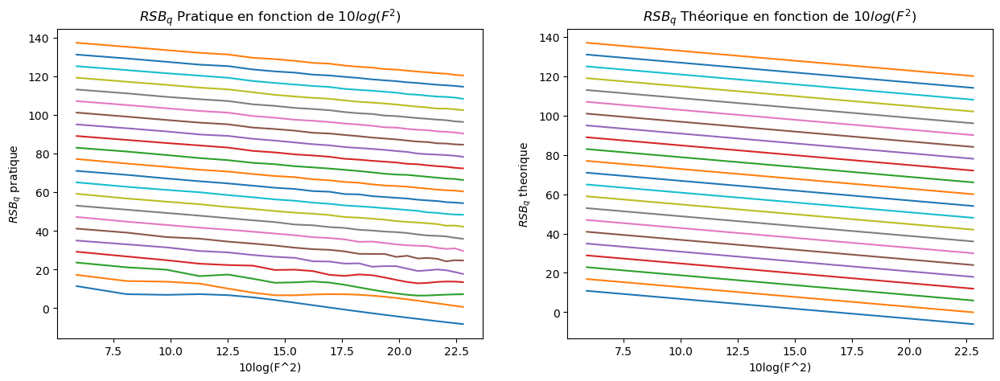

In [77]:
def RSB_q_prat(x_n,A,N):
    Y, q,Q = quantif(x_n,A,N)
    bq = Y - x_n
    std_bruit = np.std(bq)
    std_Xn = np.std(x_n)
    return 10*math.log10(std_Xn**2 / std_bruit**2)

def F(x_n,A):
    return A/np.std(x_n)
    

N_tab = np.arange(2,24,1)  # Variantion de N
A_tab = np.arange(0.7,5,0.2)  # Variation de A

fig = plt.figure(figsize=(15,5))
plt.subplot(1,2,1) 
plt.title("$RSB_q$ Pratique en fonction de $10log(F^2)$")
for N in N_tab:
    RSB_q = []
    tab_Fdb = []
    RSB_qAF_theo = []
    for A in A_tab:
        tab_Fdb.append(10*np.log10(F(x_n,A)**2))
        RSB_q.append(RSB_q_prat(x_n,A,N))
        
    plt.plot(tab_Fdb,RSB_q )
    plt.xlabel("10log(F^2)")
    plt.ylabel("$RSB_q$ pratique")

std_Xn = np.std(x_n)

plt.subplot(1,2,2)
plt.title("$RSB_q$ Théorique en fonction de $10log(F^2)$")
for N in N_tab:
    RSB_q = []
    tab_Fdb = []
    RSB_qAF_theo = []
    for A in A_tab:
        F = A/std_Xn
        tab_Fdb.append(10*np.log10(F**2))
        RSB_q.append(6*N - 10*np.log10(F**2/3))
        
    plt.plot(tab_Fdb,RSB_q )
    plt.xlabel("10log(F^2)")
    plt.ylabel("$RSB_q$ theorique")


**Remarque:** 
- En changant N, le nombre de bit, La courbe du rapport signal sur bruit est translatée vers le haut, ce qui correspond à la formule théorique du RSBq.
- Les courbes pratiques, ne sont pas tout à fait des droites,les petites valeurs de N causent des erreurs de quantifications.
    

#### Question 6 (c) : 
Quelles sont les conséquences d’une pleine échelle trop faible par rapport à la variance
du signal x ?

- si A prend une valeur tres petite, le signal prossède dans la grande majorité du temps une valeur supérieure à A, ce qui ammène à considérer toutes ces parties du signal égales à +/-A. Cette saturation provoque beaucoup d'erreurs.


#### Question 7 : 
Enfin, écouter l’effet de la quantification sur le signal audio voice.wav fourni en fonction de N. A partir de
quelle valeur ne percevez-vous plus de différences avec le signal original?


In [78]:
bits = np.arange(2,16,1)
samplerate, x = wav.read("sounds/voice.wav")  #Upload du signal
x_n =  x /(2**15) # Normalisation du signal 
display(Audio("sounds/voice.wav")) # écoute du signal
A = 1
for i in range(len(bits)):
    Y, q,Q  = quantif(x_n, A, bits[i])
    print ("N = " ,bits[i])
    display(Audio(Y,rate=samplerate))

N =  2


N =  3


N =  4


N =  5


N =  6


N =  7


N =  8


N =  9


N =  10


N =  11


N =  12


N =  13


N =  14


N =  15


#### Remarque : 
- Pour N allant de 2 à 5, le signal audio est trés bruité, et celui ci diminu au fur est à mesure que N augmente, comme observé précedement sur la courbe RSBq en fonction de N.
- A partir de N = 9, on entend quasiment plus de bruit.

## Rééchantillonnage et repliement spectral

Une rythmique a été enregistrée en studio, convertie en signal numérique et sauvegardée
dans le fichier rythmique.wav. On souhaite étudier l’effet de la fréquence d’échantillonnage sur
le contenu spectral du signal enregsitré et du son restitué.

### Rythmique :


#### Question 01 : 
Charger le signal audio stéréo rythmique.wav, et préciser sa fréquence d’échantillonnage.
Il sera noté x
R dans la suite du TP.



In [79]:
Fe , xR = wav.read('sounds/rythmique.wav') #Chargement du son
tR =  (1/Fe)*np.arange(len(xR))
print("Fréquence d'échantillonage Fe = {}".format(Fe))
print("xR.shape = {}".format(xR.shape))

Fréquence d'échantillonage Fe = 48000
xR.shape = (390615, 2)


C:\Users\zahra\AppData\Local\Temp\ipykernel_17016\653834313.py:1: WavFileWarning: Chunk (non-data) not understood, skipping it.
  Fe , xR = wav.read('sounds/rythmique.wav') #Chargement du son


#### Question 02 : 
Afficher l’une des 2 voix du signal en fonction du temps

Text(0, 0.5, 'Amplitude')

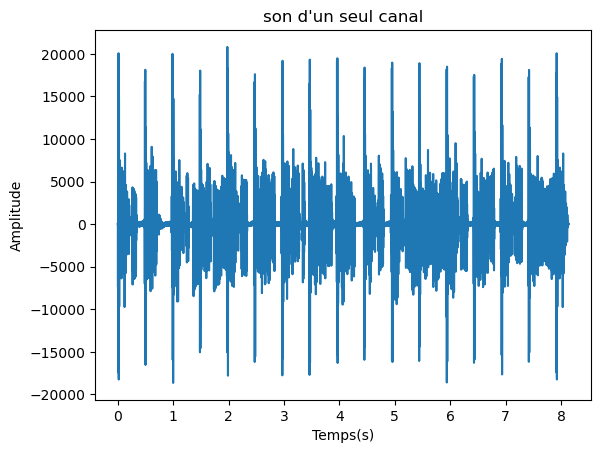

In [80]:
plt.plot(tR,xR[:,0])
plt.title("son d'un seul canal")
plt.xlabel("Temps(s)")
plt.ylabel("Amplitude")

#### Question 03: 
. Calculer et afficher son spectre : module en dB et phase, avec un axe fréquentiel linéaire.
Sur quel intervalle de fréquence se trouve l’information (musicale) ? En déduire la fréquence
d’échantillonnage minimale pouvant être utilisée pour un tel enregistrement. Elle sera notée
F
min
s dans la suite du TP.

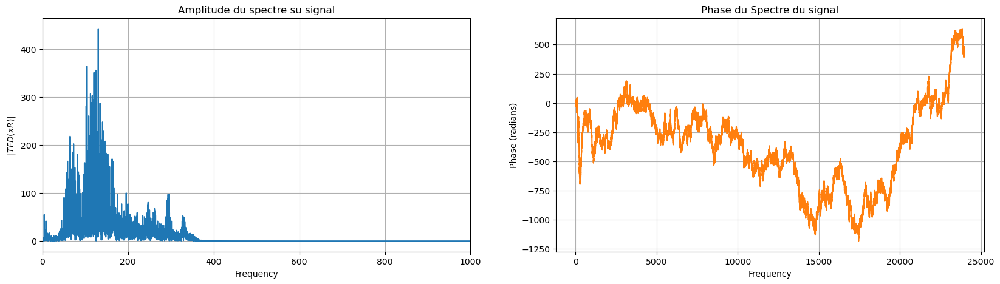

In [81]:
# Calcul de TFD du signal 
XRf = np.fft.fft(xR[:,0])

plt.figure(figsize = (20,5))
plt.subplot(1,2,1)
f = np.linspace(0, Fe,len(xR[:,0]))
plt.plot(f, np.abs(XRf)/len(xR[:,0]))
plt.title("Amplitude du spectre su signal")
plt.xlabel("Frequency")
plt.ylabel("$|TFD(xR)|$")
plt.xlim(0, 1000)
plt.grid(True)  

plt.subplot(1,2,2)
plt.phase_spectrum(xR[:,0], Fs=Fe, color='C1')
plt.title("Phase du Spectre du signal")
plt.grid(True)


**Remarque** 

#### Question 04 : 
Afin de simuler un échantillonnage à la fréquence Fmin, on choisit de sous-échantillonner s
le signal xR d’un facteur N. Cette opération consiste à prélever dans xR : 1 échantillon tous les N échantillons et à le copier dans un nouveau signal noté $xRdec : ∀k ∈ Z, xRdec[k] = xR[1 + (k − 1)N]$.
Déterminer le facteur N simulant un échantillonnage à la fréquence la plus proche possible de Fmin. Construire le signal sous-échantillonné xR .

La valeur de N qui permet la simulation d' un sous-échantillonage à la fréquence la plus proche de Fs_min : N =  61


Text(0.5, 1.0, 'Signal sous echantilloné à Fs_min')

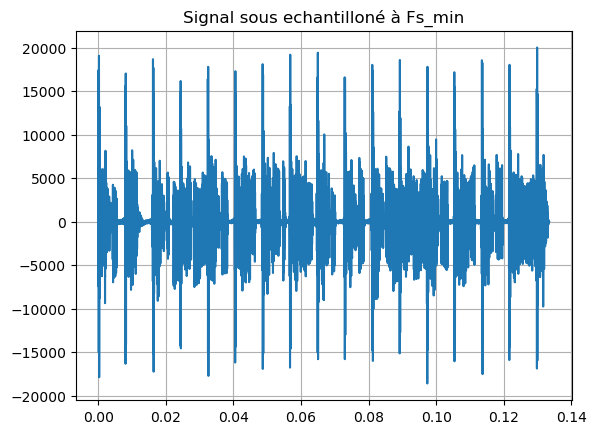

In [82]:
# Sous echantillonage du signal rythmique.wav à une fréquence d'échantillonage minimal 

fmax_xR = 390 # Hz
Fs_min = 2*fmax_xR

N = math.floor(Fe/Fs_min) # 
print("La valeur de N qui permet la simulation d' un sous-échantillonage à la fréquence la plus proche de Fs_min : N = ", N)  

k = 1
yr_1 = []
yr_2 = []

for i in range(len(xR)):
    if i == 1+(k-1)*N :
        yr_1.append(xR[i, 0])
        yr_2.append(xR[i, 1])
        k += 1
xRdec = np.array([yr_1, yr_2]).transpose()

t_sous_ech = np.linspace(0, len(xRdec)*(1/Fe), len(xRdec))

plt.figure()
plt.plot(t_sous_ech, xRdec[:, 0])
plt.grid(True) 
plt.title("Signal sous echantilloné à Fs_min")

#### Question 05 :
 Comparer les signaux xR et xRdec.


Text(0.5, 1.0, "son d'un seul canal, sous echantilloné")

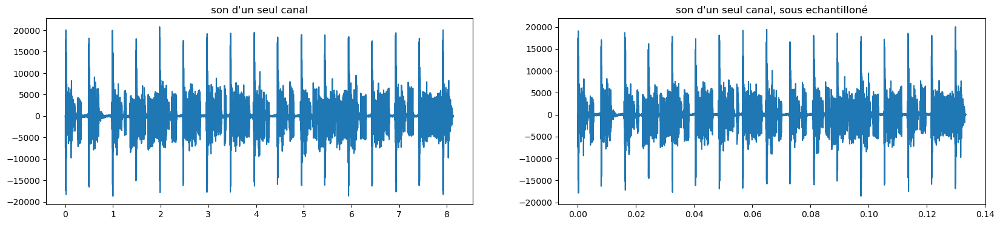

In [83]:
# 5. Comparer les signaux xR et xRdec.
plt.figure(figsize=(20,4))
plt.subplot(1,2,1)
plt.plot(tR,xR[:,0])
plt.title("son d'un seul canal")

plt.subplot(1,2,2)
plt.plot(t_sous_ech,xRdec[:,0])
plt.title("son d'un seul canal, sous echantilloné")


#### Remarque : 
- Le signal échantilloné respecte la théoème de shannon, les signaux ont la meme forme.


#### Question 06 :
Calculer le spectre de xR dec (module et phase) sur un nombre de points fréquentiels égal à celui de xR. Quel est l’effet du sous-échantillonnage sur l’amplitude et la position des
composantes fréquentielles ?

Text(0.5, 1.0, 'Spectre du spectre du signal Sous-échantilloné')

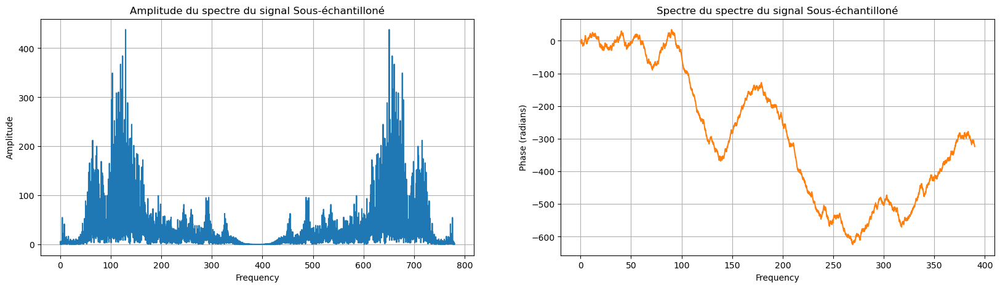

In [84]:
# Calcul de la TDF du signal
XRf = np.fft.fft(xRdec[:,0])
# Echelle de fréquence
f = np.linspace(0, Fs_min,len(xRdec[:,0]))

plt.figure(figsize = (20,5))
plt.subplot(1,2,1)
plt.plot(f, np.abs(XRf)/len(xRdec[:,0]))
plt.title("Amplitude du spectre du signal Sous-échantilloné")
plt.xlabel("Frequency")
plt.ylabel("Amplitude")
plt.grid(True)

plt.subplot(1,2,2)
plt.phase_spectrum(xRdec[:,0], Fs=Fs_min, color='C1')
plt.grid(True)  
plt.title("Spectre du spectre du signal Sous-échantilloné")



**Remarque** : Le spectre est périodisé toutes les fréquences Fe, et comme celle ci est petite, les deux motifs symétiques se rapprochent, mais sans pour autant se chevaucher.

#### Question 07: 
La fréquence Fmin permettra-t-elle, comme souhaité, de restituer le signal musical sans
perte d’information ? Pour vérification, exporter xRdec en .wav à la fréquence de reconstruction Fmin. 

 - La féquence Fmin respecte le théorème de shannon, elle nous permet  donc de restituer le signal original sans perte d'information utile.
 
 - Il n'y pas de repliment spectral visible sur le spectre pour cette fréquence d'échantillonnage.

**Ecouter et comparer le signal audio obtenu au signal initial rythmique.wav.**

In [85]:
print("Signal sous-échantilloné à Fs_min")
display(Audio(xRdec[:,0], rate =Fs_min))

print("Signal original")
display(Audio(xR[:,0], rate =Fe))


Signal sous-échantilloné à Fs_min


Signal original


**export du signal rééchantillonné sous format wav**

In [87]:
# export du signal rééchantillonné sous format wav
wav.write("outputSounds/rythm_sous_sch.wav", Fs_min, xRdec[:,0].astype(np.float64))

# jouer l'audio du signal rééchantillonné
Fe_s,XRdec_se = wav.read("outputSounds/rythm_sous_sch.wav")
print('son rythmique rééchantillonné')
display(Audio(XRdec_se,rate=Fe_s))

# jouer l'audio du signal original
print('son rythmique original')
display(Audio(xR[:,0],rate=Fe))

son rythmique rééchantillonné


son rythmique original


**Remarque :** En écoutant le signal audio original ainsi que le signal sous échantillonné, nous ne remarquons pas de différence.

## **Piano**
Charger maintenant le signal audio piano.wav

Fréquence d'échantillonage de piano.wav :  Fe  = 44100
xP.shape = (500000,)


Text(0.5, 1.0, 'sounds/piano.wav')

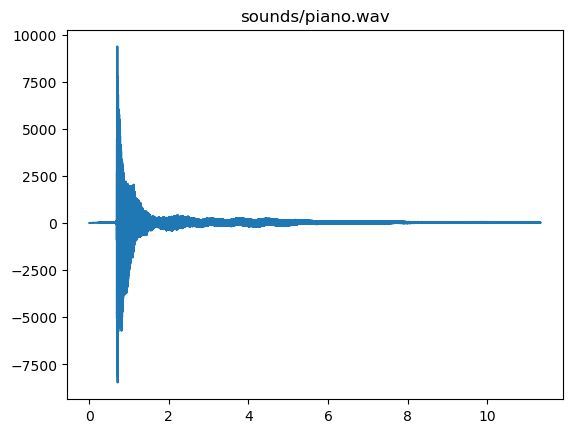

In [88]:
# Upload du son piano.wav
Fe_xP , xP = wav.read('sounds/piano.wav')
tP =  (1/Fe_xP)*np.arange(len(xP))
print("Fréquence d'échantillonage de piano.wav :  Fe  = {}".format(Fe_xP))
print("xP.shape = {}".format(xP.shape))
display(Audio(xP, rate=Fe_xP)) 

# 2. Afficher signal en fonction du temps.
plt.plot(tP,xP)
plt.title("sounds/piano.wav")

#### Question 08 : 
Calculer et afficher son spectre : module en dB et phase, avec un axe fréquentiel linéaire. Sur quel intervalle de fréquence se trouve l’information (musicale) ? En déduire la fréquence d’échantillonnage minimale pouvant être utilisée pour un tel enregistrement. Elle sera notée Fmin dans la suite du TP

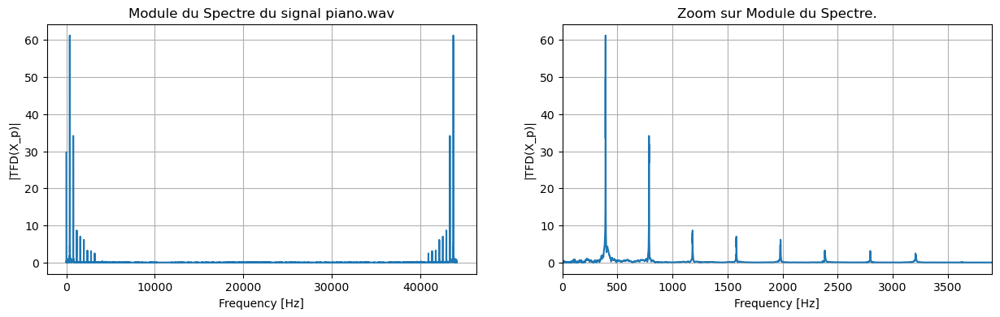

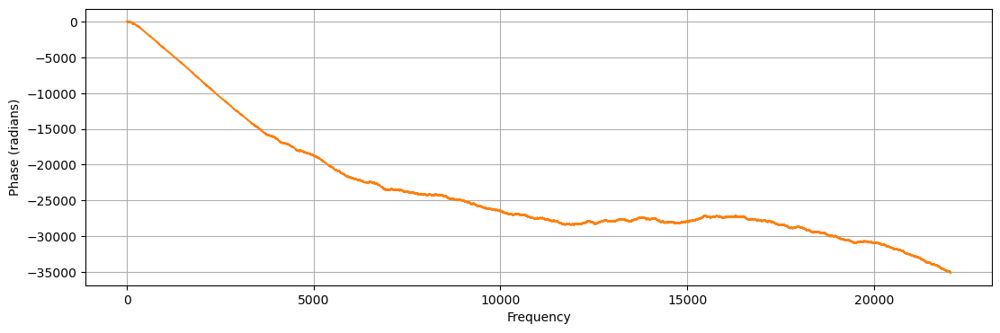

In [89]:
# Calcul du spectre du signal original piano.wav
TFD_xP = np.fft.fft(xP)
f = np.linspace(0, Fe_xP,len(xP))

plt.figure(figsize =(15,4))
plt.subplot(1,2,1)
plt.plot(f, np.abs(TFD_xP)/len(xP))
plt.grid(True)  
plt.title("Module du Spectre du signal piano.wav")
plt.xlabel("Frequency [Hz]")
plt.ylabel("|TFD(X_p)|")

plt.subplot(1,2,2)
plt.plot(f, np.abs(TFD_xP)/len(xP))
plt.grid(True) 
plt.xlim([0,3900])
plt.title("Zoom sur Module du Spectre.")
plt.xlabel("Frequency [Hz]")
plt.ylabel("|TFD(X_p)|")

# Tracé de la phase du spectre du signal piano.wav
plt.figure(figsize=(13,4))
plt.phase_spectrum(xP, Fs=Fe_xP, color='C1')
plt.grid(True)


**Opérations de sous-échantillonage**

In [90]:
# Sous echantillonage à 6800 Hz 
fmax_xP = 3400 # Hz
Fs_min_xP = 2*fmax_xP

N = math.floor(Fe_xP/Fs_min_xP)
k = 1
yp = []
for i in range(len(xP)):
    if i == 1+(k-1)*N :
        yp.append(xP[i])
        k += 1
xP1dec = np.array(yp).transpose()
t_sous_ech_1 = np.linspace(0, len(xP1dec)*(1/Fe_xP), len(xP1dec))


# sous echantillonage à 1024 ! Shanon not respected
N = math.floor(Fe_xP/1024)
k = 1
yP = []
for i in range(len(xP)):
    if i == 1+(k-1)*N :
        yP.append(xP[i])
        k += 1    
        
xP2dec = np.array(yP)
t_sous_ech_2 = np.linspace(0, len(xP2dec)*(1/Fe_xP), len(xP2dec)) 

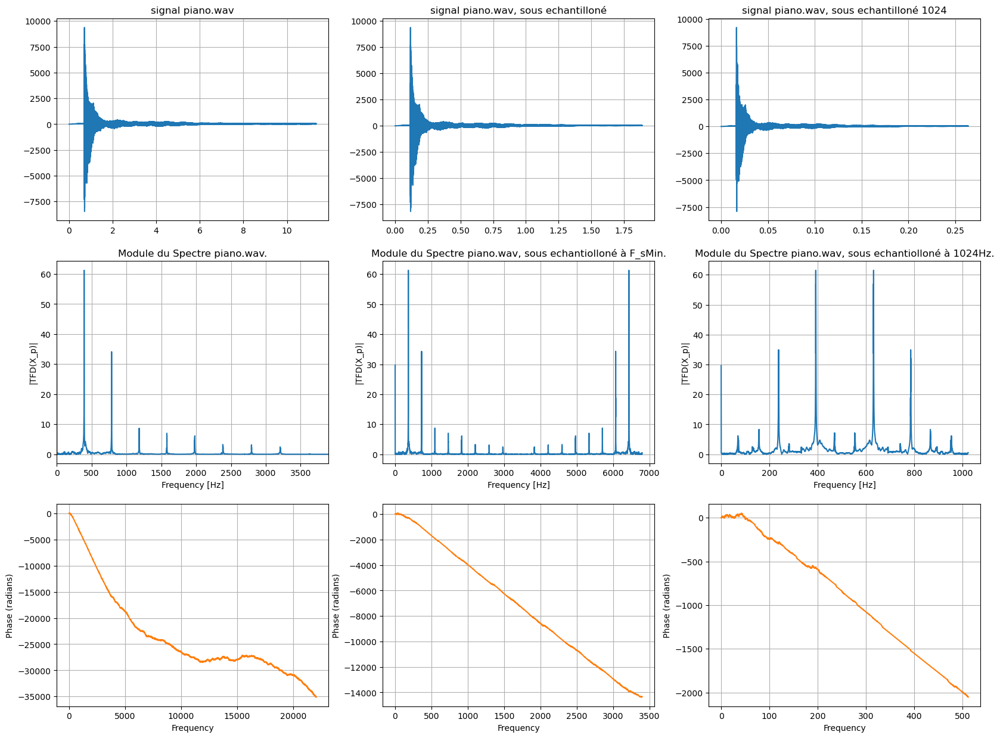

In [91]:
# Comparer les signaux xP et xPdec.
plt.figure(figsize=(20,15))
plt.subplot(3,3,1)
plt.plot(tP,xP)
plt.title("signal piano.wav")
plt.grid()

plt.subplot(3,3,2)
plt.plot(t_sous_ech_1,xP1dec)
plt.title("signal piano.wav, sous echantilloné")
plt.grid()

plt.subplot(3,3,3)
plt.plot(t_sous_ech_2,xP2dec)
plt.title("signal piano.wav, sous echantilloné 1024")
plt.grid()


# 6. Calculer le spectre de xPdec (module et phase) sur un nombre de points fréquentiels égal à celui de xP.
# Quel est l’effet du sous-échantillonnage sur l’amplitude et la position des composantes fréquentielles ?

plt.subplot(3,3,4)
plt.plot(np.linspace(0, Fe_xP,len(xP)), np.abs(TFD_xP)/len(xP))
plt.grid(True) 
plt.xlim([0,3900])
plt.title("Module du Spectre piano.wav.")
plt.xlabel("Frequency [Hz]")
plt.ylabel("|TFD(X_p)|")

# Calcul du specte
TFD_xP1dec = np.fft.fft(xP1dec)
f = np.linspace(0, Fs_min_xP,len(xP1dec))

plt.subplot(3,3,5)
plt.plot(f, np.abs(TFD_xP1dec)/len(xP1dec))
plt.grid(True)
plt.title("Module du Spectre piano.wav, sous echantiolloné à F_sMin.")
plt.xlabel("Frequency [Hz]")
plt.ylabel("|TFD(X_p)|")


# Calcul du spectre du signal echantilloné à 1024Hz
TFD_xP2dec = np.fft.fft(xP2dec)
f = np.linspace(0, 1024,len(xP2dec))

plt.subplot(3,3,6)
plt.plot(f, np.abs(TFD_xP2dec)/len(xP2dec))
plt.grid(True)
plt.title("Module du Spectre piano.wav, sous echantiolloné à 1024Hz.")
plt.xlabel("Frequency [Hz]")
plt.ylabel("|TFD(X_p)|")

# Phase du signal original piano.wav
plt.subplot(3,3,7)
plt.phase_spectrum(xP, Fs=Fe_xP, color='C1')
plt.grid(True)

# Phase du signal échantilloné à Fsmin
plt.subplot(3,3,8)
plt.phase_spectrum(xP1dec, Fs=Fs_min_xP, color='C1')
plt.grid(True)  

# Phase du signal échantilloné à 1024Hz
plt.subplot(3,3,9)
plt.phase_spectrum(xP2dec, Fs=1024, color='C1')
plt.grid(True) 

#### QUESTION 11 :
- phénomène responsable des distorsions observées dans le spectre : Le **repliment spectral** du au non respect du théorme de shanon.

- il y'a pertes d'information spectrale à partir de Fe/2 = 1024/2. Toutes les valeurs du spectre situées entre Fe/2 et la fréquence maximale du signal vont se sommer avec d'autres fréquences de la partie symétrique du spectre due à la symétrie hermitienne, ce qui va causer l'apparition de nouvelles pics fréquences. 

- Ces nouvelles informations vont apparaitre sous forme de bruits et vont changer le signal audio(Le son est plus grave).

In [93]:
# Sauvegarde des sons sous echantillonés
wav.write("outputSounds/piano_Fsmin.wav",Fs_min_xP,xP1dec)
wav.write("outputSounds/piano_1024Hz.wav",1024,xP2dec)
print("fin de la sauvegarde.")

print("Signal sous-échantilloné à 1024")
display(Audio(xP2dec, rate = 1024 ))

fin de la sauvegarde.
Signal sous-échantilloné à 1024


In [94]:
# lire les fichier piano1.wav et piano2.wav pour les ecouter :
fs_xp1, xp1 = wav.read('outputSounds/piano_Fsmin.wav')
fs_xp2, xp2 = wav.read('outputSounds/piano_1024Hz.wav')
print("piano_Fsmin.wav")
display (Audio(xp1 , rate=fs_xp1))
print("piano_1024Hz.wav")
display (Audio(xp2 , rate=fs_xp2))

piano_Fsmin.wav


piano_1024Hz.wav


Fréquence d'échantillonage de violon.wav :  Fe  = 48000
xP.shape = (468391,)


C:\Users\zahra\AppData\Local\Temp\ipykernel_17016\3713186712.py:6: WavFileWarning: Chunk (non-data) not understood, skipping it.
  Fe_xViolon , xViolon = wav.read('sounds/violon.wav')


(0.0, 8000.0)

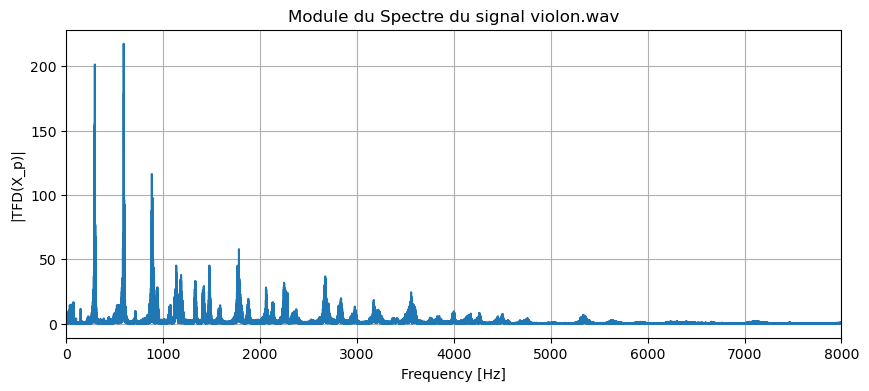

In [95]:
# BONUS

# Violon

# Chargement du signal
Fe_xViolon , xViolon = wav.read('sounds/violon.wav')

tViolon =  (1/Fe_xViolon)*np.arange(len(xViolon))
print("Fréquence d'échantillonage de violon.wav :  Fe  = {}".format(Fe_xViolon))
print("xP.shape = {}".format(xViolon.shape))
display(Audio(xViolon, rate=Fe_xViolon)) 

TFD_xViolon = np.fft.fft(xViolon)
f = np.linspace(0, Fe_xViolon,len(xViolon))

plt.figure(figsize =(10,4))
plt.plot(f, np.abs(TFD_xViolon)/len(xViolon))
plt.grid(True)  
plt.title("Module du Spectre du signal violon.wav")
plt.xlabel("Frequency [Hz]")
plt.ylabel("|TFD(X_p)|")
plt.xlim([0,8000])



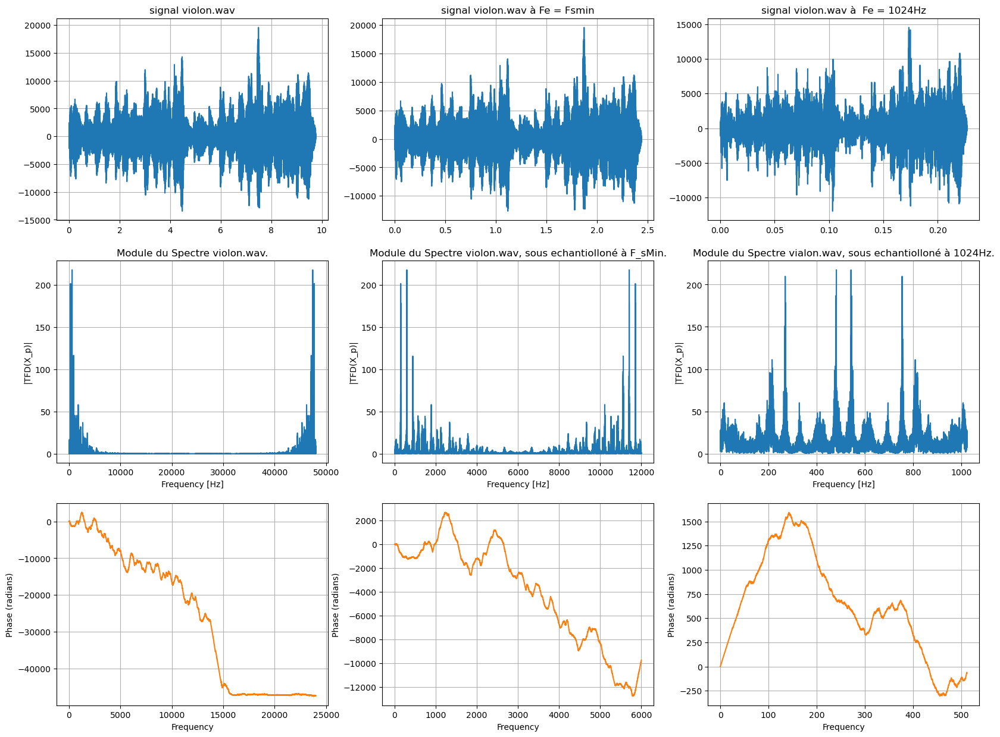

In [96]:
# Calcul des sous echantillonage

# Sous echantillonage à 12000 Hz 
fmax_xViolon = 6000 # Hz
Fs_min_xViolon = 2*fmax_xViolon

N = math.floor(Fe_xViolon/Fs_min_xViolon)
k = 1
yV = []
for i in range(len(xViolon)):
    if i == 1+(k-1)*N :
        yV.append(xViolon[i])
        k += 1
xViolon1_dec = np.array(yV).transpose()
t_sous_ech_1 = np.linspace(0, len(xViolon1_dec)*(1/Fe_xViolon), len(xViolon1_dec))


# sous echantillonage à 1024 !
N = math.floor(Fe_xP/1024)
k = 1
yV = []
for i in range(len(xViolon)):
    if i == 1+(k-1)*N :
        yV.append(xViolon[i])
        k += 1    
xViolon2_dec = np.array(yV).transpose()
t_sous_ech_2 = np.linspace(0, len(xViolon2_dec)*(1/Fe_xViolon), len(xViolon2_dec))

## Question 3 : 

# 5. Comparer les signaux xViolon et xViolon_dec.
plt.figure(figsize=(20,15))
plt.subplot(3,3,1)
plt.plot(tViolon,xViolon)
plt.title("signal violon.wav")
plt.grid()

plt.subplot(3,3,2)
plt.plot(t_sous_ech_1,xViolon1_dec)
plt.title("signal violon.wav à Fe = Fsmin")
plt.grid()

plt.subplot(3,3,3)
plt.plot(t_sous_ech_2,xViolon2_dec)
plt.title("signal violon.wav à  Fe = 1024Hz")
plt.grid()


# 6. Calculer le spectre de xRdec (module et phase) sur un nombre de points fréquentiels égal à celui de xR.
# Quel est l’effet du sous-échantillonnage sur l’amplitude et la position des composantes fréquentielles ?

plt.subplot(3,3,4)
plt.plot(np.linspace(0, Fe_xViolon,len(xViolon)), np.abs(TFD_xViolon)/len(xViolon))
plt.grid(True) 
#plt.xlim([0,1000])
plt.title("Module du Spectre violon.wav.")
plt.xlabel("Frequency [Hz]")
plt.ylabel("|TFD(X_p)|")

# Calcul du specte
TFD_xViolon1_dec = np.fft.fft(xViolon1_dec)
f = np.linspace(0, Fs_min_xViolon,len(xViolon1_dec))

plt.subplot(3,3,5)
plt.plot(f, np.abs(TFD_xViolon1_dec)/len(xViolon1_dec))
plt.grid(True)
plt.title("Module du Spectre violon.wav, sous echantiolloné à F_sMin.")
plt.xlabel("Frequency [Hz]")
plt.ylabel("|TFD(X_p)|")


# Calcul du spectre du signal echantilloné à 1024Hz
TFD_xViolon2_dec = np.fft.fft(xViolon2_dec)
f = np.linspace(0, 1024,len(xViolon2_dec))

plt.subplot(3,3,6)
plt.plot(f, np.abs(TFD_xViolon2_dec)/len(xViolon2_dec))
plt.grid(True)
plt.title("Module du Spectre vialon.wav, sous echantiolloné à 1024Hz.")
plt.xlabel("Frequency [Hz]")
plt.ylabel("|TFD(X_p)|")

# Phase du signal original piano.wav
plt.subplot(3,3,7)
plt.phase_spectrum(xViolon, Fs=Fe_xViolon, color='C1')
plt.grid(True)

# Phase du signal échantilloné à Fsmin
plt.subplot(3,3,8)
plt.phase_spectrum(xViolon1_dec, Fs=Fs_min_xViolon, color='C1')
plt.grid(True)  

# Phase du signal échantilloné à 1024Hz
plt.subplot(3,3,9)
plt.phase_spectrum(xViolon2_dec, Fs=1024, color='C1')
plt.grid(True) 


Fréquence d'échantillonage de orchestre.wav :  Fe  = 48000
xP.shape = (1157990, 2)


C:\Users\zahra\AppData\Local\Temp\ipykernel_17016\2802725592.py:4: WavFileWarning: Chunk (non-data) not understood, skipping it.
  Fe_xOrch , xOrch = wav.read('sounds/orchestre.wav')


(0.0, 10000.0)

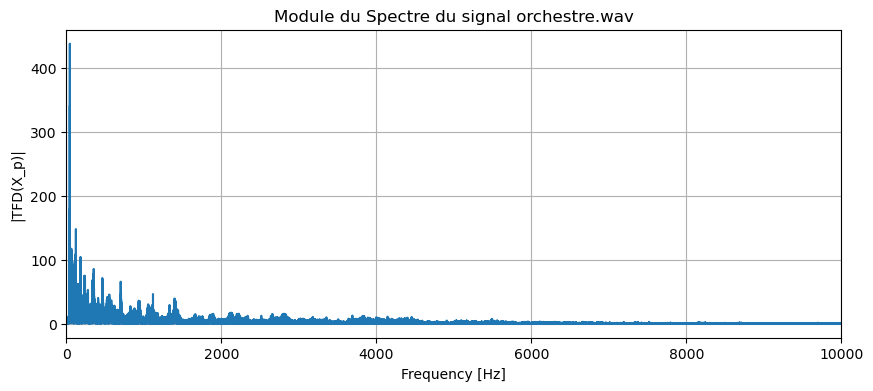

In [97]:
# Orchestre

# Chargement du signal
Fe_xOrch , xOrch = wav.read('sounds/orchestre.wav')

tOrch =  (1/Fe_xOrch)*np.arange(len(xOrch))
print("Fréquence d'échantillonage de orchestre.wav :  Fe  = {}".format(Fe_xOrch))
print("xP.shape = {}".format(xOrch.shape))
display(Audio(xOrch[:,0], rate=Fe_xOrch)) 


TFD_xOrch = np.fft.fft(xOrch[:,0])
f = np.linspace(0, Fe_xOrch,len(xOrch))


plt.figure(figsize =(10,4))
plt.plot(f, np.abs(TFD_xOrch)/len(xOrch))
plt.grid(True)  
plt.title("Module du Spectre du signal orchestre.wav")
plt.xlabel("Frequency [Hz]")
plt.ylabel("|TFD(X_p)|")
plt.xlim([0,10000])

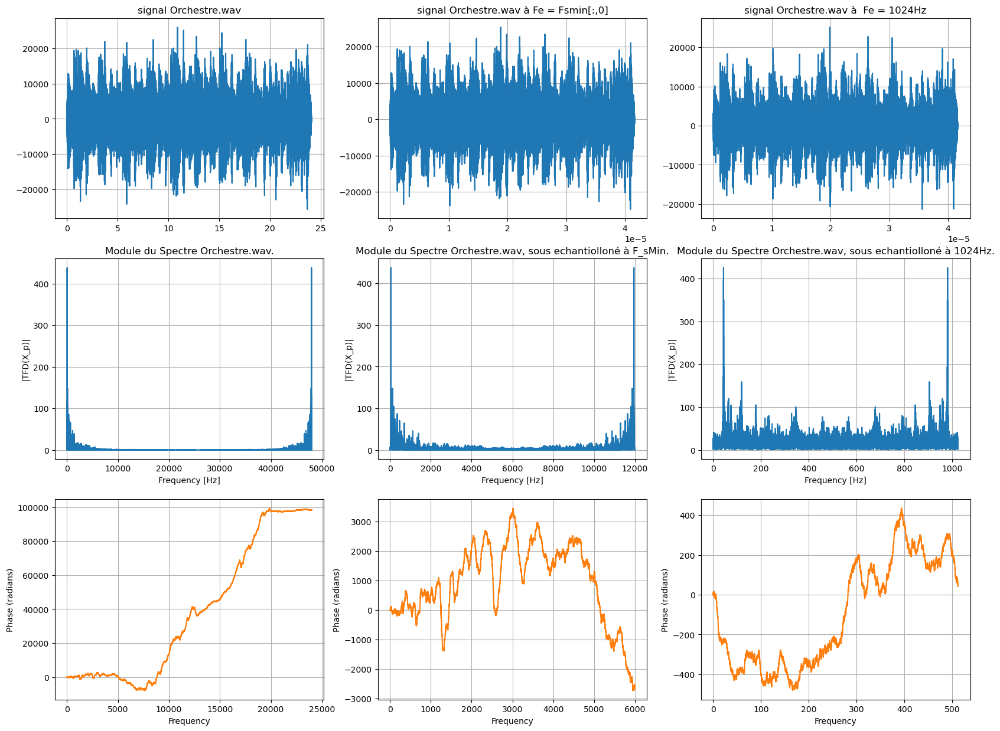

In [98]:
# Calcul des sous echantillonage

# Sous echantillonage à 12000 Hz 
fmax_xOrch = 6000 # Hz
Fs_min_xOrch = 2*fmax_xOrch

N = math.floor(Fe_xOrch/Fs_min_xOrch)

k = 1
yO = []
for i in range(len(xOrch)):
    if i == 1+(k-1)*N :
        yO.append(xOrch[i])
        k += 1
xOrch1_dec = np.array(yO).transpose()
t_sous_ech_1 = np.linspace(0, len(xOrch1_dec)*(1/Fe_xOrch), len(xOrch1_dec[0,:]))


# sous echantillonage à 1024 !
N = math.floor(Fe_xOrch/1024)
k = 1
yO = []
for i in range(len(xOrch)):
    if i == 1+(k-1)*N :
        yO.append(xOrch[i])
        k += 1    
xOrch2_dec = np.array(yO).transpose()
t_sous_ech_2 = np.linspace(0, len(xOrch2_dec)*(1/Fe_xOrch), len(xOrch2_dec[0,:]))


## Question 3 : 



# 5. Comparer les signaux xViolon et xViolon_dec.
#plt.figure()
plt.figure(figsize=(20,15))
plt.subplot(3,3,1)
plt.plot(tOrch,xOrch[:,0])
plt.title("signal Orchestre.wav")
plt.grid()


plt.subplot(3,3,2)
plt.plot(t_sous_ech_1,xOrch1_dec[0,:])
plt.title("signal Orchestre.wav à Fe = Fsmin[:,0]")
plt.grid()

plt.subplot(3,3,3)
plt.plot(t_sous_ech_2,xOrch2_dec[0,:])
plt.title("signal Orchestre.wav à  Fe = 1024Hz")
plt.grid()



# 6. Calculer le spectre de xRdec (module et phase) sur un nombre de points fréquentiels égal à celui de xR.
# Quel est l’effet du sous-échantillonnage sur l’amplitude et la position des composantes fréquentielles ?

plt.subplot(3,3,4)
plt.plot(np.linspace(0, Fe_xOrch,len(xOrch)), np.abs(TFD_xOrch)/len(xOrch))
plt.grid(True) 
#plt.xlim([0,1000])
plt.title("Module du Spectre Orchestre.wav.")
plt.xlabel("Frequency [Hz]")
plt.ylabel("|TFD(X_p)|")

# Calcul du specte
TFD_xOrch1_dec = np.fft.fft(xOrch1_dec[0,:])

      
f = np.linspace(0, Fs_min_xOrch,len(xOrch1_dec[0,:]))

plt.subplot(3,3,5)
plt.plot(f, np.abs(TFD_xOrch1_dec)/len(xOrch1_dec[0,:]))
plt.grid(True)
plt.title("Module du Spectre Orchestre.wav, sous echantiolloné à F_sMin.")
plt.xlabel("Frequency [Hz]")
plt.ylabel("|TFD(X_p)|")


# Calcul du spectre du signal echantilloné à 1024Hz
TFD_xOrch2_dec = np.fft.fft(xOrch2_dec[0,:])
f = np.linspace(0, 1024,len(xOrch2_dec[0,:]))

plt.subplot(3,3,6)
plt.plot(f, np.abs(TFD_xOrch2_dec)/len(xOrch2_dec[0,:]))
plt.grid(True)
plt.title("Module du Spectre Orchestre.wav, sous echantiolloné à 1024Hz.")
plt.xlabel("Frequency [Hz]")
plt.ylabel("|TFD(X_p)|")

# Phase du signal original piano.wav
plt.subplot(3,3,7)
plt.phase_spectrum(xOrch[:,0], Fs=Fe_xOrch, color='C1')
plt.grid(True)

# Phase du signal échantilloné à Fsmin
plt.subplot(3,3,8)
plt.phase_spectrum(xOrch1_dec[0,:], Fs=Fs_min_xOrch, color='C1')
plt.grid(True)  

# Phase du signal échantilloné à 1024Hz
plt.subplot(3,3,9)
plt.phase_spectrum(xOrch2_dec[0,:], Fs=1024, color='C1')
plt.grid(True) 



[0 0 0 ... 0 0 0]
Fréquence d'échantillonage de orchestre.wav :  Fe  = 16000
xP.shape = (171744,)


(0.0, 15000.0)

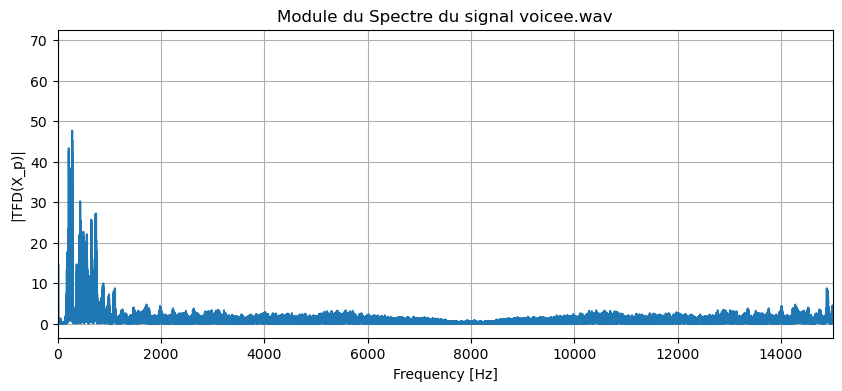

In [99]:
# Voice

# Chargement du signal
Fe_xVoice , xVoice = wav.read('sounds/voice.wav')
print(xVoice)

tVoice =  (1/Fe_xVoice)*np.arange(len(xVoice))
print("Fréquence d'échantillonage de orchestre.wav :  Fe  = {}".format(Fe_xVoice))
print("xP.shape = {}".format(xVoice.shape))
display(Audio(xVoice, rate=Fe_xVoice)) 


TFD_xVoice = np.fft.fft(xVoice)
f = np.linspace(0, Fe_xVoice,len(xVoice))


plt.figure(figsize =(10,4))
plt.plot(f, np.abs(TFD_xVoice)/len(xVoice))
plt.grid(True)  
plt.title("Module du Spectre du signal voicee.wav")
plt.xlabel("Frequency [Hz]")
plt.ylabel("|TFD(X_p)|")
plt.xlim([0,15000])

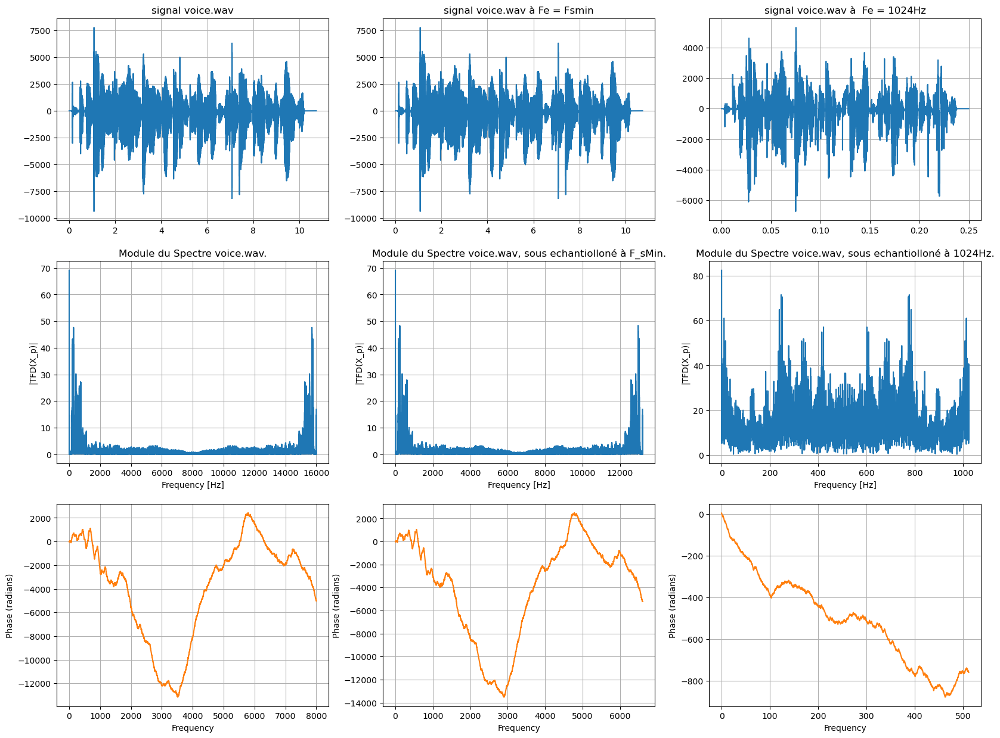

In [100]:
# Calcul des sous echantillonage

# Sous echantillonage à 13200 Hz 
fmax_xVoice = 6600 # Hz
Fs_min_xVoice = 2*fmax_xVoice

N = math.floor(Fe_xVoice/Fs_min_xVoice)
k = 1
yV = []
for i in range(len(xVoice)):
    if i == 1+(k-1)*N :
        yV.append(xVoice[i])
        k += 1
xVoice1_dec = np.array(yV).transpose()
t_sous_ech_1 = np.linspace(0, len(xVoice1_dec)*(1/Fe_xVoice), len(xVoice1_dec))


# sous echantillonage à 1024 !
N = math.floor(Fe_xP/1024)
k = 1
yV = []
for i in range(len(xVoice)):
    if i == 1+(k-1)*N :
        yV.append(xVoice[i])
        k += 1    
xVoice2_dec = np.array(yV).transpose()
t_sous_ech_2 = np.linspace(0, len(xVoice2_dec)*(1/Fe_xVoice), len(xVoice2_dec))

## Question 3 : 

# 5. Comparer les signaux xViolon et xViolon_dec.
plt.figure(figsize=(20,15))
plt.subplot(3,3,1)
plt.plot(tVoice,xVoice)
plt.title("signal voice.wav")
plt.grid()

plt.subplot(3,3,2)
plt.plot(t_sous_ech_1,xVoice1_dec)
plt.title("signal voice.wav à Fe = Fsmin")
plt.grid()

plt.subplot(3,3,3)
plt.plot(t_sous_ech_2,xVoice2_dec)
plt.title("signal voice.wav à  Fe = 1024Hz")
plt.grid()


# 6. Calculer le spectre de xRdec (module et phase) sur un nombre de points fréquentiels égal à celui de xR.
# Quel est l’effet du sous-échantillonnage sur l’amplitude et la position des composantes fréquentielles ?

plt.subplot(3,3,4)
plt.plot(np.linspace(0, Fe_xVoice,len(xVoice)), np.abs(TFD_xVoice)/len(xVoice))
plt.grid(True) 
#plt.xlim([0,1000])
plt.title("Module du Spectre voice.wav.")
plt.xlabel("Frequency [Hz]")
plt.ylabel("|TFD(X_p)|")

# Calcul du specte
TFD_xVoice1_dec = np.fft.fft(xVoice1_dec)
f = np.linspace(0, Fs_min_xVoice,len(xVoice1_dec))

plt.subplot(3,3,5)
plt.plot(f, np.abs(TFD_xVoice1_dec)/len(xVoice1_dec))
plt.grid(True)
plt.title("Module du Spectre voice.wav, sous echantiolloné à F_sMin.")
plt.xlabel("Frequency [Hz]")
plt.ylabel("|TFD(X_p)|")


# Calcul du spectre du signal echantilloné à 1024Hz
TFD_xVoice2_dec = np.fft.fft(xVoice2_dec)
f = np.linspace(0, 1024,len(xVoice2_dec))

plt.subplot(3,3,6)
plt.plot(f, np.abs(TFD_xVoice2_dec)/len(xVoice2_dec))
plt.grid(True)
plt.title("Module du Spectre voice.wav, sous echantiolloné à 1024Hz.")
plt.xlabel("Frequency [Hz]")
plt.ylabel("|TFD(X_p)|")

# Phase du signal original piano.wav
plt.subplot(3,3,7)
plt.phase_spectrum(xVoice, Fs=Fe_xVoice, color='C1')
plt.grid(True)

# Phase du signal échantilloné à Fsmin
plt.subplot(3,3,8)
plt.phase_spectrum(xVoice1_dec, Fs=Fs_min_xVoice, color='C1')
plt.grid(True)  

# Phase du signal échantilloné à 1024Hz
plt.subplot(3,3,9)
plt.phase_spectrum(xVoice2_dec, Fs=1024, color='C1')
plt.grid(True) 



### Conclusion: 

- Nous avons mis en oeuvre la quantification de plusieurs signaux, et nous avons confirmez la théorie sur l'évolution du RSBq en fonction de N le nombre de bit et A, la valeur de pleine échelle.
- Nous avons également vu la périodisation du spectre d'un signal échantilloné toutes les multiples de Fe.
- Ce TP à aussi confirmer l'importance du respect du théorème de shannon sur l'échantillonnage des signaux audio et des signaux en générales.
- Le non-respect du théorème de shannon, donne surface au phénomène du Repliment Spéctral(Aliasing) ou des fréquences qui ne devraient pas s'y trouver apparaissent dans le spectre du signal sous-échantilloné et lors de la restitution du signal audio, ce dernier va etre largement modifié par rapport au signal original.
